In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FuncFormatter
from matplotlib import gridspec

# Nearly free electron model

# Theory

Tha Hamiltonian $H$ is made of blocks of $H_q$. Each $H_q$ is a $(2m+1) \times (2m+1)$ matrix. If we choose to expand $u_q$ in plane wave basis ${e^{iGx}}$ where $$G \in \{ G(m),G(m-1),...,G(1),G(0),G(-1),...,G(-m+1), G(-m) \}$$ $$\text{and }G(m)=\frac{2\pi m}{a}$$

Let us consider $m=2$ and construct $H_q$ for $$V(x)= A\cos\left(\frac{2\pi x}{a}\right) + B\cos\left(\frac{4\pi x}{a}\right)$$

In this case, each $H_q$ will be a $5 \times 5$ matrix and $$G \in \{ G(2),G(1),G(0),G(-1),G(-2)\}$$

In our case, 
\begin{align*}
    V(x) &= A\cos\left(\frac{2\pi x}{a}\right) + B\cos\left(\frac{4\pi x}{a}\right)\\
    &=\frac{A}{2}\left(e^{\frac{2\pi x}{a}}+e^{-\frac{2\pi x}{a}}\right) + \frac{B}{2}\left(e^{\frac{4\pi x}{a}}+e^{-\frac{4\pi x}{a}}\right)\\
    &= V_1 + V_2
\end{align*}

These two terms can be separately integrated to find the appropriate fourier coefficients.

\begin{align*}
   \langle \psi_m | V_1 | \psi_n \rangle &= \frac{A}{2}\int e^{i2\pi mx/a} \left(e^{i2\pi x/a} + e^{-i2\pi x/a} \right) e^{-i2\pi nx/a} dx\\
    &= \frac{A}{2}\int e^{i2\pi (m-n)x/a} \left(e^{i2\pi x/a} + e^{-i2\pi x/a} \right) dx\\
    &= \frac{A}{2}\int e^{\frac{i2\pi x}{a}(m-n+1)} dx + \frac{A}{2}\int e^{\frac{i2\pi x}{a}(m-n+1)} dx
\end{align*}

Using the orthogonality properties of the periodic function inside the intergal, the only non-zero terms that survive here are,
$$\implies \boxed{V_{G(\pm 1)} = \frac{A}{2} \text{ if }m = n \pm 1}$$

Similarly,
\begin{align*}
    \langle \psi_m | V_2 | \psi_n \rangle &= \frac{B}{2}\int e^{i2\pi mx/a} \left(e^{i4\pi x/a} + e^{-i4\pi x/a} \right) e^{-i2\pi nx/a} dx\\
    &= \frac{B}{2}\int e^{i2\pi (m-n)x/a} \left(e^{i4\pi x/a} + e^{-i2\pi x/a} \right) dx\\
    &= \frac{B}{2}\int e^{\frac{i4\pi x}{a}(m-n+2)} dx + \frac{A}{2}\int e^{\frac{i4\pi x}{a}(m-n+2)} dx
\end{align*}
   $$ \implies \boxed{V_{G(\pm 2)} = \frac{B}{2} \text{ if }m = n \pm 2}$$

Hence our fourier coefficients are $V_{G_0} = 0, V_{G_1} = A/2$ and $V_{G_2} = B/2$. The rest are zero. The Hamiltonian matrix will be the combination of the kinetic energy terms along the diagonal and off-diagonal terms being the potential energy terms (using the conditions set on $m$ and $n$).

$$H_q = \begin{pmatrix} 
 T_{q-2G} & V_{G_1} & V_{G_2} & V_{G_3} & V_{G_4} \\ 
 V_{G_{-1}} & T_{q-G} & V_{G_1} & V_{G_2} & V_{G_3} \\ 
 V_{G_{-2}} & V_{G_{-1}} & T_{q} & V_{G_1} & V_{G_2} \\ 
 V_{G_{-3}} & V_{G_{-2}} & V_{G_{-1}} & T_{q+G} & V_{G_1}\\ 
 V_{G_{-4}} & V_{G_{-3}} & V_{G_{-2}} & V_{G_{-1}} & T_{q+2G}
\end{pmatrix}$$
$$\boxed{H_q=\begin{pmatrix} 
 T_{q-2G} & A/2 & B/2 & 0 & 0 \\ 
 A/2 & T_{q-G} & A/2 & B/2 & 0\\ 
 B/2 & A/2 & T_{q} &A/2 & B/2 \\ 
 0 & B/2 & A/2 & T_{q+G} & A/2\\
 0 & 0 & B/2 & A/2 & T_{q+2G}
\end{pmatrix}}$$

where $T_q = \frac{\hbar^2}{2m}q^2$ is the kinetic energy term. For simplicity we consider $\frac{\hbar^2}{2m} = 1$ in the following code.

# Implementation

In [2]:
# Define parameters
pi = np.pi
a = 1
G = 2 * pi / a
N = 5 # number of bands to show

# Hamiltonian
def hamiltonian(q, A=0, B=0, C=0, D=0):
    A /= 2
    B /= 2
    C /= 2
    D /= 2
    return np.array([
        [(q-2*G)**2, A, B, C, D],
        [-A/2, 1*(q-G)**2, A, B, D],
        [B, -A/2, (q)**2, A, B],
        [C, B, -A/2, 1*(q+G)**2, A],
        [D, C, B, -A/2, (q+2*G)**2]
    ])

def eigenvalues(q, A, B, C, D):
    return np.linalg.eigvalsh(hamiltonian(q, A, B, C, D))

In [3]:
# formatting axes
def format_func_x(value, tick_number):
    # Set major ticks at multiples of \pi
    n = int(np.round(value / pi))
    if n == 0:
        return "0"
    elif n == 1:
        return r"$\frac{\pi}{a}$"
    elif n == -1:
        return r"$-\frac{\pi}{a}$"
    else:
        return r'$\frac{{{}\pi}}{{a}}$'.format(n)

def format_func_y(value, tick_number):
    # Set major ticks at multiples of \pi^2
    n = int(np.round(value/(pi)**2))
    if n == 0:
        return "0"
    else:
        return r"$\frac{{{}\pi^2}}{{a^2}}$".format(n)

In [ ]:
# function to generate the energy band diagram for an arbitrary A and B
def sketch_energy_bands(A, B, C=0, D=0, gaps=[]):
    plt.figure(figsize=(12, 6))

    gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1]) 
    ax0 = plt.subplot(gs[0]) # overall band structure
    ax1 = plt.subplot(gs[1]) # Brillouin Zone

    for i in range(1,N+1):
        ax0.axhline((i*pi)**2/a**2, color='k', linestyle=':', alpha=0.4)

    # Set the range of k
    q_range = np.arange(-1.5 * G, 1.5 * G, 0.01)

    # calculate the eigenvalues of H and plot the band structures
    all_eigenvalues = [eigenvalues(q, A, B, C, D) for q in q_range]
    c = ['r', 'g', 'b', 'purple', 'orange']
    
    last_max = None
    brillouin_indices = np.where((q_range > 0) & (q_range < pi/a))

    for i in range(N):
        ei = [e[i] for e in all_eigenvalues]
        ax0.plot(q_range, ei, label=f'n = {i+1}', color=c[i])
        ax1.plot(q_range, ei, label=f'n = {i+1}', color=c[i])

        # un-comment this part if you want to print the values of the calculated bandgaps
        # if i > 0:
        #     print(f'Band gap b/w {i} & {i+1}: {np.min(ei) - last_max:.2f}')
        # last_max = np.max(ei[np.min(brillouin_indices):np.max(brillouin_indices)+1])
        
    # Formatting
    ax0.legend()
    ax0.set_xlim(-1.5 * G, 1.5 * G)
    ax0.set_title('Energy Band Diagram for NFE Model\n'+' '+r'($A$ = {0}, $B$ = {1})'.format(A, B), fontsize=14)
    # ax0.set_title('Energy Band Diagram for NFE Model\n'+' '+r'($A$ = {0}, $B$ = {1}, $C$ = {2}, $D$ = {3})'.format(A, B, C, D), fontsize=14)
    ax1.set_xlim(0 * G, 0.5 * G)
    ax1.set_title('Corresponding\nBrillouin Zone')
    ax0.set_ylabel('Energy', fontsize=14)
    for ax in (ax0, ax1):
        ax.xaxis.set_major_locator(MultipleLocator(base=pi))
        ax.xaxis.set_major_formatter(FuncFormatter(format_func_x))
        ax.yaxis.set_major_locator(MultipleLocator(base=5*pi**2))
        ax.yaxis.set_major_formatter(FuncFormatter(format_func_y))
        ax.tick_params(axis='both', which='major', labelsize=13)
        ax.set_xlabel('$q$', fontsize=14)
        ax.set_ylim(top=35*pi**2)
    for e1, e2 in gaps:
        ax0.fill_between(q_range, e1, e2, alpha=0.2, color='k', ec=None)
        ax1.fill_between(q_range, e1, e2, alpha=0.2, color='k', ec=None)

# Results

## A = 0, B = 0 (Free electron)

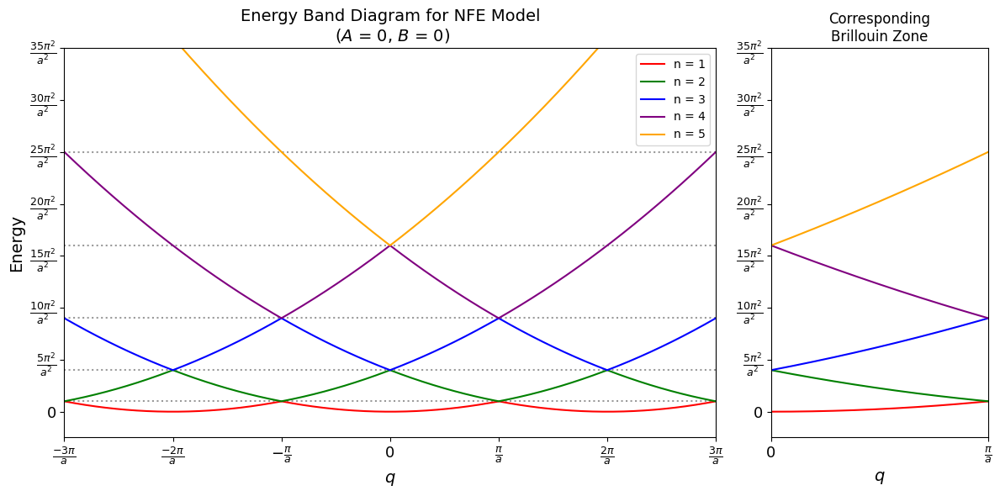

In [69]:
sketch_energy_bands(0,0)
plt.tight_layout();plt.savefig('nearly free electron/images/1.png', dpi=300)

## A = 1, B = 0
Here, the coefficients have been multiplied by 10, $A = 10$ so that the energy gap is more clearly visible. As you can see, this opens up a gap between the first and second bands at $q=\pi/a$ of magnitude $A$. The energy gap has been highlighted in the plot.

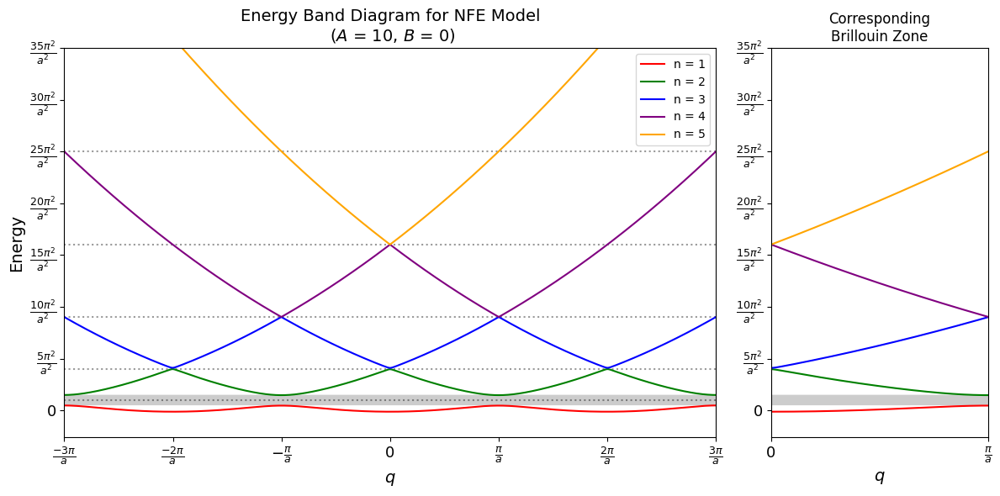

In [66]:
E1 = pi**2
sketch_energy_bands(10,0, gaps=[(E1+5, E1-5)])
plt.tight_layout();plt.savefig('nearly free electron/images/2.png', dpi=300)

## A = 1, B = 0.5
Here, the coefficients have been multiplied by 10, $A = 10, B=5$ so that the energy gap is more clearly visible. As you can see, this opens up a gap between the first and second bands at $q=\pi/a$ of magnitude $A$, and an energy gap between bands 2 and 3 at $q=0$ of magnitude $B$. The energy gaps have been highlighted in the plot.

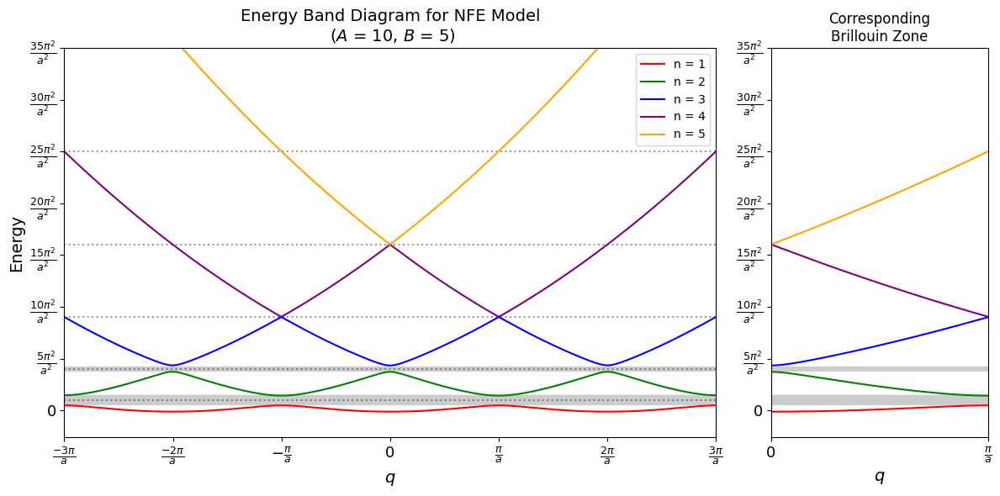

In [68]:
E2 = 4*pi**2
sketch_energy_bands(10,5, gaps=[(E1-5, E1+5), (E2-5/2, E2+5/2)])
plt.tight_layout();plt.savefig('nearly free electron/images/3.png', dpi=300)

## A = 1, B = 1
Here, the coefficients have been multiplied by 10, $A = 10, B=10$ so that the energy gap is more clearly visible. As you can see, this opens up a gap between the first and second bands at $q=\pi/a$ of magnitude $A$, and an energy gap between bands 2 and 3 at $q=0$ of magnitude $B$. The energy gaps have been highlighted in the plot.

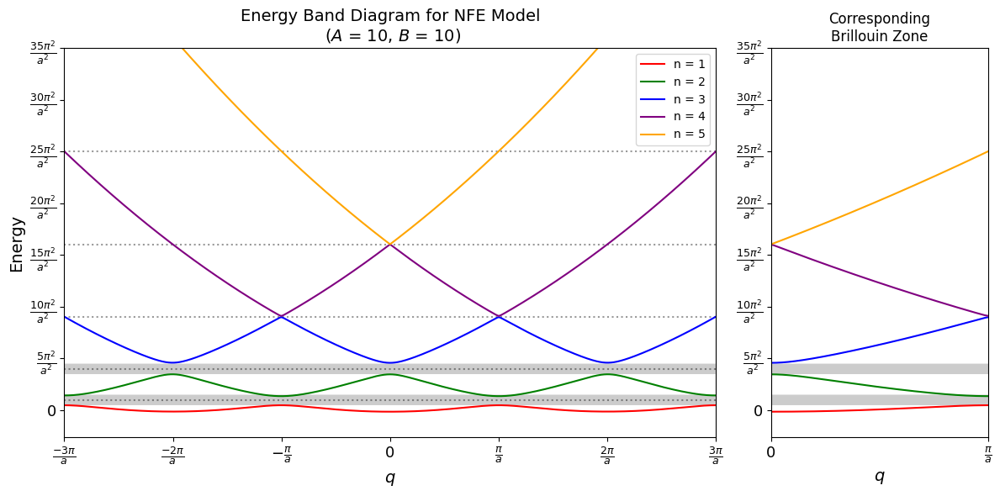

In [70]:
sketch_energy_bands(10,10, gaps=[(E1-5, E1+5), (E2-5, E2+5)])
plt.tight_layout();plt.savefig('nearly free electron/images/4.png', dpi=300)

## A = 0.5, B = 1
Here, the coefficients have been multiplied by 10, $A = 5, B=10$ so that the energy gap is more clearly visible. As you can see, this opens up a gap between the first and second bands at $q=\pi/a$ of magnitude $A$, and an energy gap between bands 2 and 3 at $q=0$ of magnitude $B$. The energy gaps have been highlighted in the plot.

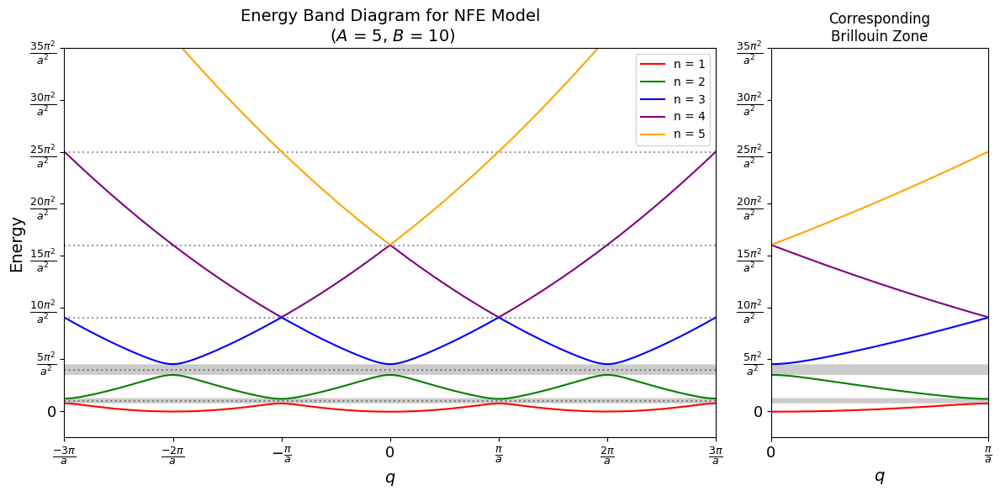

In [71]:
sketch_energy_bands(5,10, gaps=[(E1-5/2, E1+5/2), (E2-5, E2+5)])
plt.tight_layout();plt.savefig('nearly free electron/images/5.png', dpi=300)

## A = 0, B = 1
Here, the coefficients have been multiplied by 10, $B=10$ so that the energy gap is more clearly visible. As you can see, this opens up a gapbetween bands 2 and 3 at $q=0$ of magnitude $B$. The energy gaps have been highlighted in the plot.

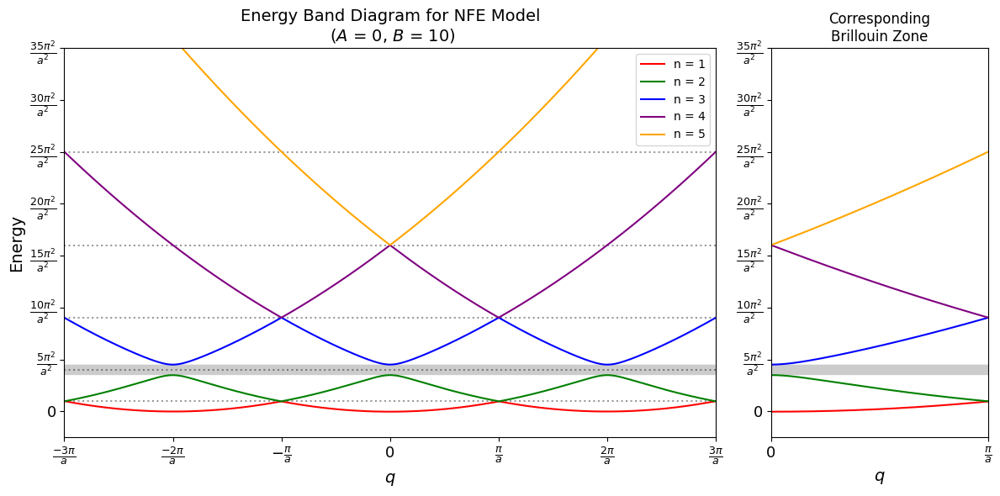

In [72]:
sketch_energy_bands(0,10, gaps=[(E2-5, E2+5)])
plt.tight_layout();plt.savefig('nearly free electron/images/6.png', dpi=300)

## For $V >> T_1$

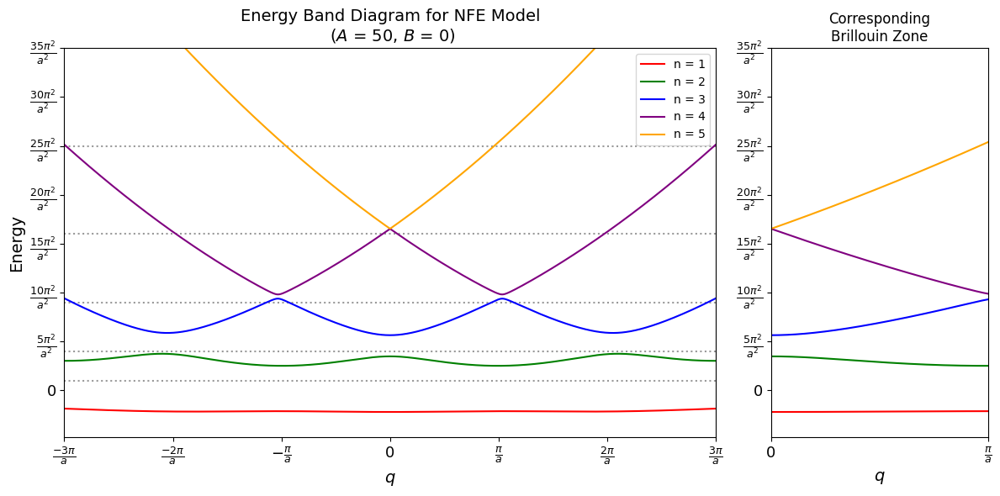

In [9]:
sketch_energy_bands(50,0, gaps=[])
plt.tight_layout();plt.savefig('docs/nearly free electron/images/h1.png', dpi=300)

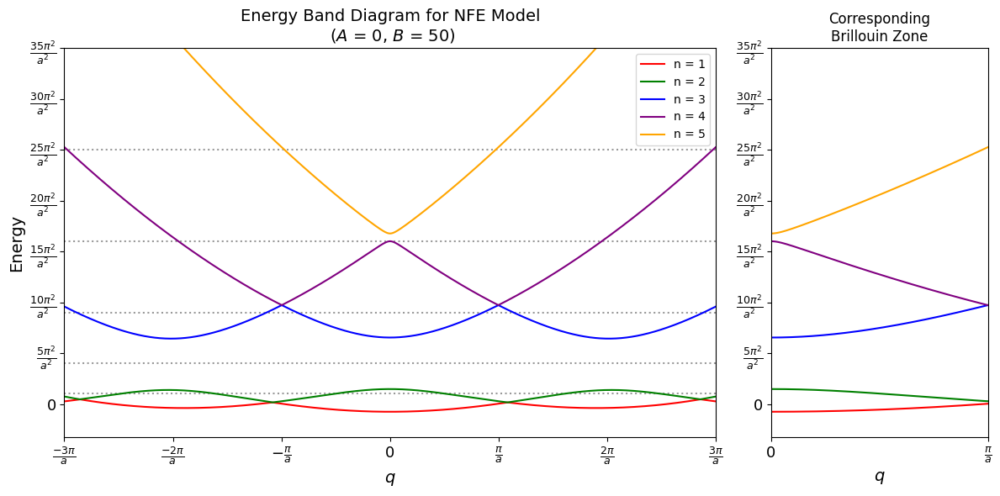

In [96]:
sketch_energy_bands(0,50, gaps=[])
plt.tight_layout();plt.savefig('nearly free electron/images/h2.png', dpi=300)

## Further playing around 

In [106]:
from matplotlib.animation import FuncAnimation
from matplotlib import rc
rc('animation', html='jshtml')

q_range = np.arange(-2 * G, 2 * G, 0.01)

### Vary $A$

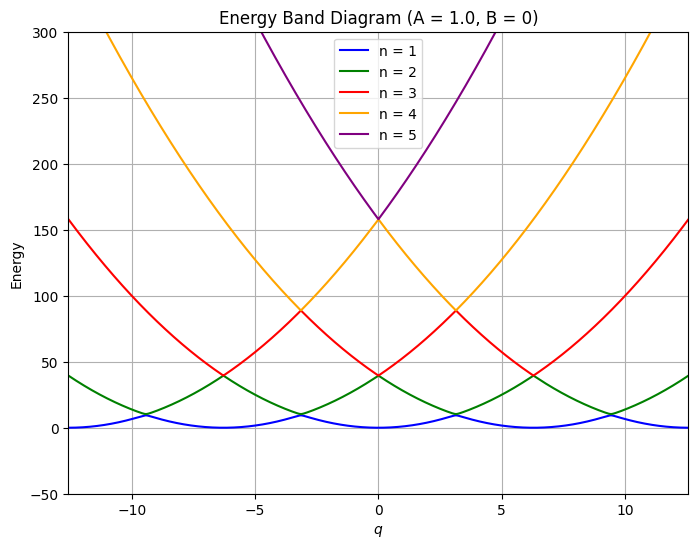

In [110]:
fig, ax0 = plt.subplots(figsize=(8, 6))
line1, = ax0.plot([], [], label='n = 1', color='b')
line2, = ax0.plot([], [], label='n = 2', color='g')
line3, = ax0.plot([], [], label='n = 3', color='r')
line4, = ax0.plot([], [], label='n = 4', color='orange')
line5, = ax0.plot([], [], label='n = 5', color='purple')
lines = [line1, line2, line3, line4, line5]
ax0.set_xlim(q_range.min(), q_range.max())
ax0.set_ylim(-50,300)
ax0.set_xlabel(r'$q$')
ax0.set_ylabel('Energy')
ax0.legend()
ax0.grid()

def update(Vo):
    eigenvalues_list = [eigenvalues(k, Vo, 0) for k in q_range]
    for i in range(N):
        ei = [e[i] for e in eigenvalues_list]
        lines[i].set_data(q_range, ei)
    ax0.set_title(f'Energy Band Diagram (A = {Vo:.1f}, B = 0)')
    return line1, line2, line3, line4, line5

V_values = np.linspace(1, 35, 50)  # V from 1 to 35
ani = FuncAnimation(fig, update, frames=V_values, blit=False, interval=100)
ani
# ani.save('energy_band_animation.gif', writer='pillow', fps=30)

### Vary $B$

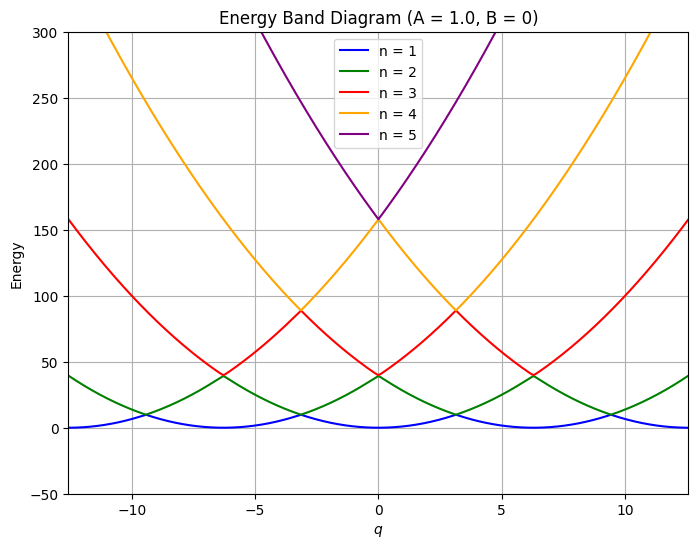

In [ ]:
fig, ax0 = plt.subplots(figsize=(8, 6))
line1, = ax0.plot([], [], label='n = 1', color='b')
line2, = ax0.plot([], [], label='n = 2', color='g')
line3, = ax0.plot([], [], label='n = 3', color='r')
line4, = ax0.plot([], [], label='n = 4', color='orange')
line5, = ax0.plot([], [], label='n = 5', color='purple')
lines = [line1, line2, line3, line4, line5]
ax0.set_xlim(q_range.min(), q_range.max())
ax0.set_ylim(-50,300)
ax0.set_xlabel(r'$q$')
ax0.set_ylabel('Energy')
ax0.legend()
ax0.grid()

def update(Vo):
    eigenvalues_list = [eigenvalues(k, 0, Vo, 0, 0) for k in q_range]
    for i in range(N):
        ei = [e[i] for e in eigenvalues_list]
        lines[i].set_data(q_range, ei)
    ax0.set_title(f'Energy Band Diagram (A = {Vo:.1f}, B = 0)')
    return line1, line2, line3, line4, line5

V_values = np.linspace(1, 35, 50)  # V from 1 to 35
ani = FuncAnimation(fig, update, frames=V_values, blit=False, interval=100)
ani
# ani.save('energy_band_animation.gif', writer='pillow', fps=30)

### Vary $A$ and $B$

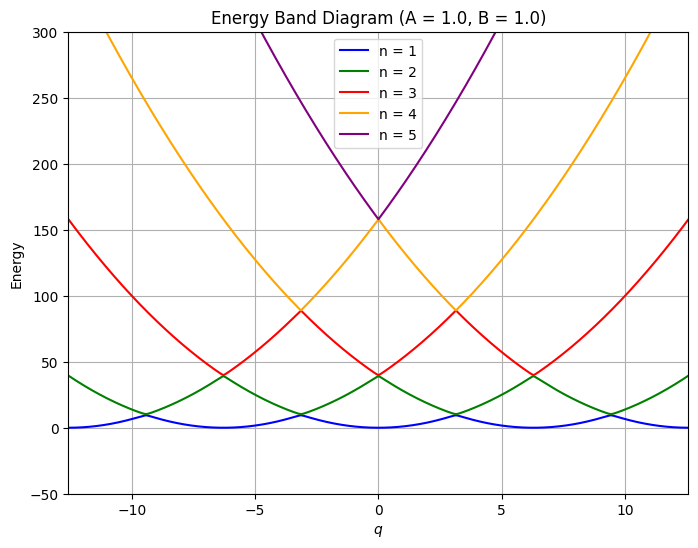

In [113]:
fig, ax0 = plt.subplots(figsize=(8, 6))
line1, = ax0.plot([], [], label='n = 1', color='b')
line2, = ax0.plot([], [], label='n = 2', color='g')
line3, = ax0.plot([], [], label='n = 3', color='r')
line4, = ax0.plot([], [], label='n = 4', color='orange')
line5, = ax0.plot([], [], label='n = 5', color='purple')
lines = [line1, line2, line3, line4, line5]
ax0.set_xlim(q_range.min(), q_range.max())
ax0.set_ylim(-50,300)
ax0.set_xlabel(r'$q$')
ax0.set_ylabel('Energy')
ax0.legend()
ax0.grid()

def update(Vo):
    eigenvalues_list = [eigenvalues(k, Vo, Vo) for k in q_range]
    for i in range(N):
        ei = [e[i] for e in eigenvalues_list]
        lines[i].set_data(q_range, ei)
    ax0.set_title(f'Energy Band Diagram (A = {Vo:.1f}, B = {Vo:.1f})')
    return line1, line2, line3, line4, line5

V_values = np.linspace(1, 35, 50)  # V from 1 to 35
ani = FuncAnimation(fig, update, frames=V_values, blit=False, interval=100)
ani
# ani.save('energy_band_animation.gif', writer='pillow', fps=30)

## Addition of $V_{G_3}$ and $V_{G_4}$

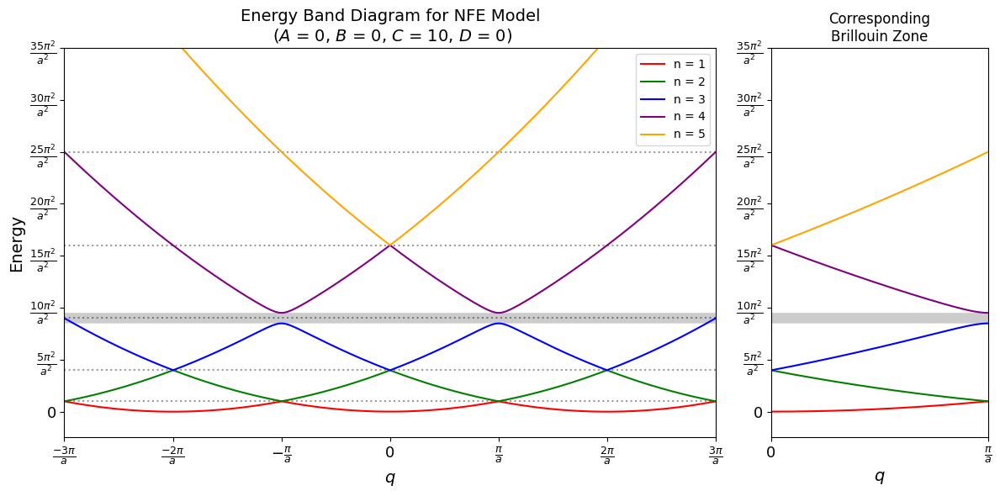

In [ ]:
E3 = (3*pi)**2
sketch_energy_bands(0,0,10,0, gaps=[(E3+5, E3-5)])
plt.tight_layout();plt.savefig('nearly free electron/images/g3.png', dpi=300)

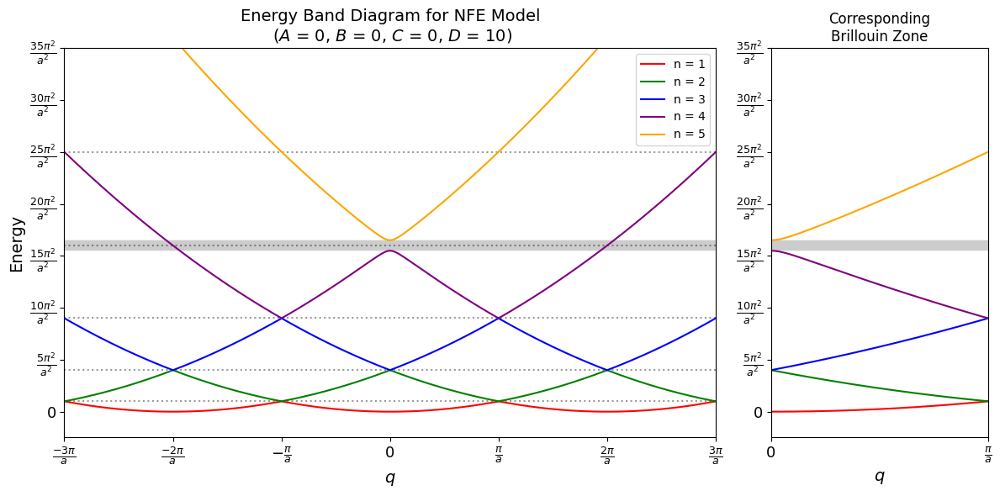

In [126]:
E4 = (4*pi)**2
sketch_energy_bands(0,0,0,10, gaps=[(E4+5, E4-5)])
plt.tight_layout();plt.savefig('nearly free electron/images/g4.png', dpi=300)

## Numerical Estimation of Bandgaps

Numerical approximation of the bandgaps being equal to the Fourier coeffients only work for really small values of $V_G$. As it increases, the deviation in our approximation also grows, since we have only used first order analysis.

Band gap b/w 1 & 2: 6.89
Band gap b/w 2 & 3: 24.72
Band gap b/w 3 & 4: 2.07
Band gap b/w 4 & 5: 31.84


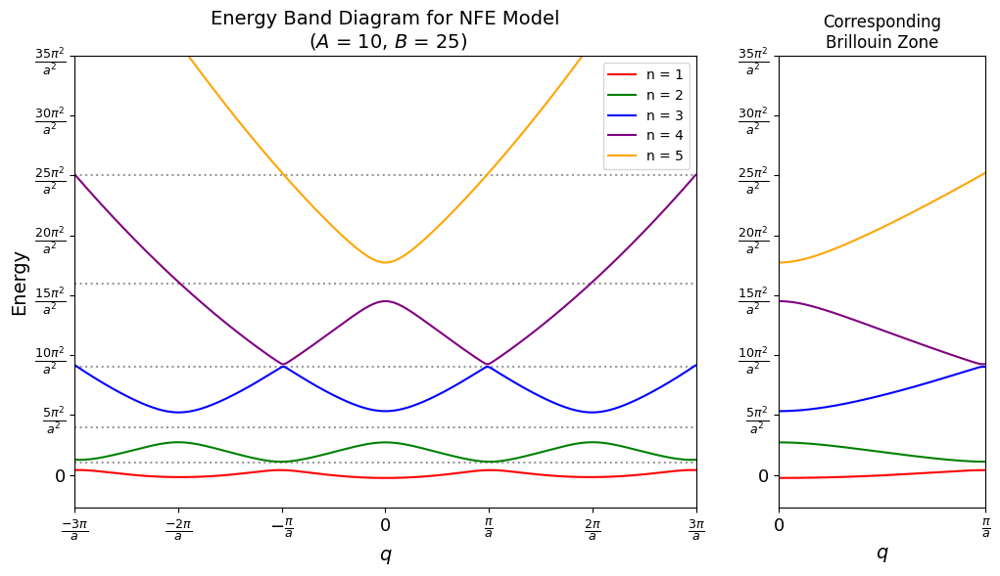

In [73]:
def hamiltonian(q, A=0, B=0, C=0, D=0):
    A /= 2
    B /= 2
    C /= 2
    D /= 2
    return np.array([
        [(q-2*G)**2, A, B, C, D],
        [A, 1*(q-G)**2, A, B, D],
        [B, A, (q)**2, A, B],
        [C, B, A, 1*(q+G)**2, A],
        [D, C, B, A, (q+2*G)**2]
    ])
E1 = pi**2
sketch_energy_bands(10,25,0,30, gaps=[])